# **Imports**

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from scipy.linalg import svd
import random
import matplotlib.pyplot as plt
import operator
import math

# **Load Data**

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
folder = '/content/gdrive/MyDrive/Team/vision/assignment2'

Mounted at /content/gdrive


# **Part 1**

In [ ]:
def loadVid(path):
	# Create a VideoCapture object and read from input file
	# If the input is the camera, pass 0 instead of the video file name
	cap = cv2.VideoCapture(path)
	 
	# Check if camera opened successfully
	if (cap.isOpened()== False): 
		print("Error opening video stream or file")

	i = 0
	# Read until video is completed
	while(cap.isOpened()):
		# Capture frame-by-frame
		i += 1
		ret, frame = cap.read()
		if ret == True:

			#Store the resulting frame
			if i == 1:
				frames = frame[np.newaxis, ...]
			else:
				frame = frame[np.newaxis, ...]
				frames = np.vstack([frames, frame])
				frames = np.squeeze(frames)
			
		else: 
			break
	 
	# When everything done, release the video capture object
	cap.release()

	return frames

(440, 350, 3)


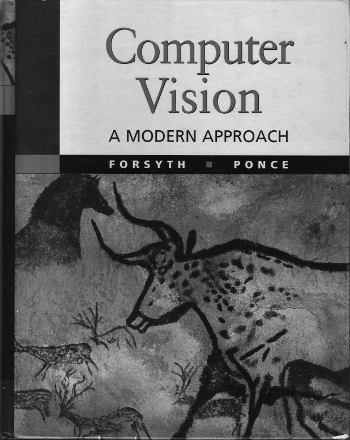

In [ ]:
img = cv2.imread(folder + '/cv_cover.jpg')
print(img.shape)
cv2_imshow(img)

In [ ]:
book_frames = loadVid(folder + '/book.mov')

(641, 480, 640, 3)


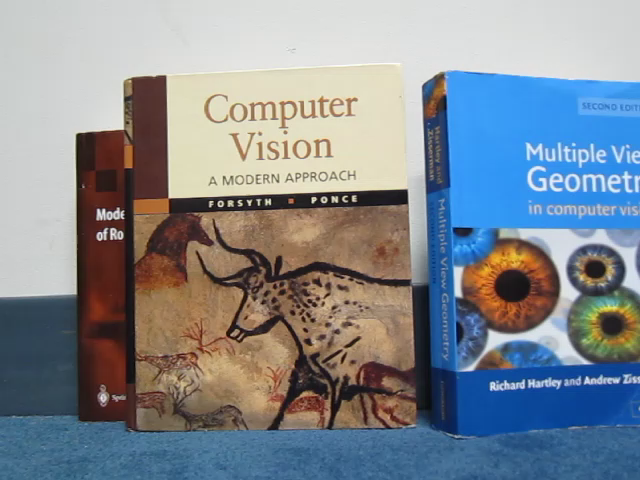

In [ ]:
print(book_frames.shape)
first_frame = book_frames[0]
cv2_imshow(first_frame)

## **1.1 Getting Correspondences**

In [ ]:
def getMatches(img1, img2):
  # convert images to grayscale
  img1_grey = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
  img2_grey = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

  # create SIFT object
  sift = cv2.xfeatures2d.SIFT_create()

  # detect SIFT features in both images
  keypoints_1, descriptors_1 = sift.detectAndCompute(img1_grey,None)
  keypoints_2, descriptors_2 = sift.detectAndCompute(img2_grey,None)

  # BFMatcher with default params
  bf_matcher = cv2.BFMatcher()
  matches = bf_matcher.knnMatch(descriptors_1, descriptors_2, k=2)

  # Apply ratio test
  good = []
  for m,n in matches:
      if m.distance < 0.75*n.distance:
          good.append(m)
  
  # Sort them in the order of their distance.
  matches = sorted(good, key = lambda x:x.distance)

  # draw first 50 matches
  matched_img = cv2.drawMatches(img1_grey, keypoints_1, img2_grey, keypoints_2, matches[:50], img2_grey, flags=2)
  
  # constructing set of corresponding image points
  # list of arrays each array containing point in image 1 and it's correspondance in p2 [p1, p1_dash]
  correspondances = []
  for i in range(len(matches)):
    match = matches[i]
    correspondances.append([keypoints_1[match.queryIdx].pt, keypoints_2[match.trainIdx].pt])

  return correspondances, matched_img

[[(129.8494873046875, 225.25643920898438), (226.9414825439453, 253.17486572265625)], [(169.99110412597656, 254.7916717529297), (260.7848205566406, 277.0030517578125)], [(149.6501922607422, 236.7246856689453), (243.7310333251953, 262.51007080078125)], [(191.7931365966797, 60.7531852722168), (273.9084777832031, 117.78026580810547)], [(107.89212799072266, 211.0980682373047), (209.1009521484375, 242.7445526123047)], [(155.9535675048828, 238.7621612548828), (248.939453125, 263.9067687988281)], [(249.93177795410156, 99.069580078125), (322.8182067871094, 146.07823181152344)], [(178.59886169433594, 60.60845947265625), (263.3882141113281, 117.87451934814453)], [(167.90914916992188, 248.2516326904297), (258.93707275390625, 271.4181823730469)], [(249.93177795410156, 99.069580078125), (322.8182067871094, 146.07823181152344)], [(191.7931365966797, 60.7531852722168), (273.9084777832031, 117.78026580810547)], [(149.6501922607422, 236.7246856689453), (243.7310333251953, 262.51007080078125)], [(256.870

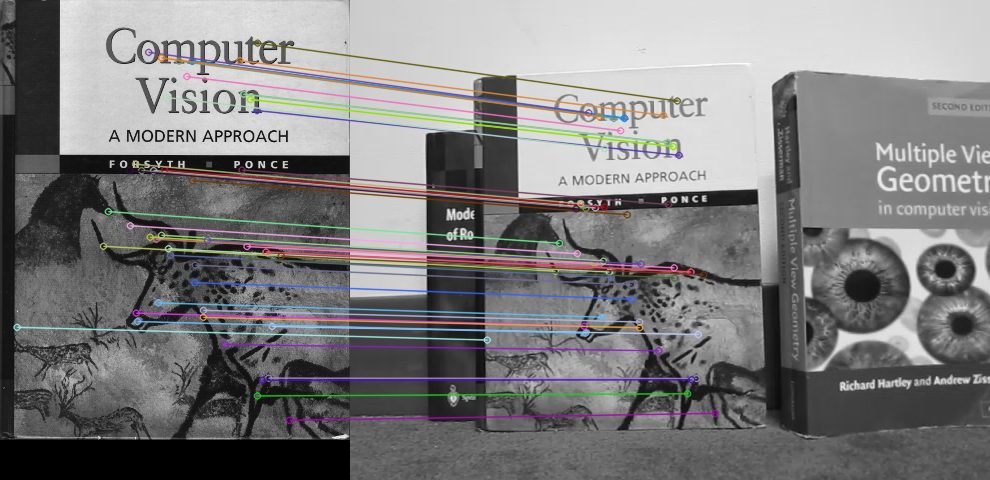

In [ ]:
correspondances, matched_img = getMatches(img, first_frame)
print(correspondances)
print(len(correspondances))
cv2_imshow(matched_img)

## **1.2 Compute the Homography Parameters**

In [ ]:
def computeHomography(correspondances):

  # constructing A  2*num_of_correspondance x 9
  A = []
  for corr in correspondances:
    p1 = corr[0]
    p2 = corr[1]
    a1 = [-p1[0], -p1[1], -1, 0, 0, 0, p1[0]*p2[0], p1[1]*p2[0], p2[0]]
    a2 = [0, 0, 0, -p1[0], -p1[1], -1, p1[0]*p2[1], p1[1]*p2[1], p2[1]]

    A.append(a1)
    A.append(a2)

  A = np.array(A)
  # Compute SVD of A
  # eigen values are stored from the largest to the smallest
  u, s, v_transpose = svd(A)

  # get vector corresponding to smallest eigen value and reshape it into 3 x 3
  h = np.reshape(v_transpose[8], (3, 3))
  
  #normalize and now we have h
  h = (1/h.item(8)) * h

  return h

In [ ]:
def compute_p_dash(h, p,check=False):
  p = np.transpose([p[0], p[1], 1])
  p_dash = np.dot(h, p) 
  # normalize first 2 coordinates
  p_dash /= p_dash[2]
  if check == True :
     return (p_dash[0], p_dash[1])
  return (int(p_dash[0]), int(p_dash[1]))

In [ ]:
def RANSAC(correspondances):
   maxInliers = []
   maxInliersH = None
   for i in range(500):
     # Get four point correspondences (randomly)
     corr1 = correspondances[random.randrange(0, len(correspondances))]
     corr2 = correspondances[random.randrange(0, len(correspondances))]
     corr3 = correspondances[random.randrange(0, len(correspondances))]
     corr4 = correspondances[random.randrange(0, len(correspondances))]

     random_correspondances = []
     random_correspondances.append(corr1)
     random_correspondances.append(corr2)
     random_correspondances.append(corr3)
     random_correspondances.append(corr4)
     
     # Compute H using DLT
     h = computeHomography(random_correspondances)

     # Count inliers
     inliers = []
     for corr in correspondances:
       p1_dash = compute_p_dash(h, corr[0])
       # compare p2 [point in frame] with p1_dash
       error = np.linalg.norm(np.asarray(corr[1]) - np.asarray(p1_dash))
       if error < 5 :
         inliers.append(corr)

     # Keep H if largest number of inliers
     if len(inliers) > len(maxInliers):
       maxInliers = inliers
       maxInliersH = h
   return maxInliers 

In [ ]:
max_inliers = RANSAC(correspondances)
h = computeHomography(max_inliers)
print(h)

[[ 7.80323401e-01  4.92581492e-03  1.18853996e+02]
 [-4.76737658e-02  7.82894017e-01  7.68529455e+01]
 [-7.95699067e-05 -6.84638429e-05  1.00000000e+00]]


verify

In [ ]:
# built in comparison 
src_points = [[src[0], src[1]] for src, dest in max_inliers]
dest_points = [[dest[0], dest[1]] for src, dest in max_inliers]
built_in_h, _ = cv2.findHomography(np.array(src_points), np.array(dest_points))
print(built_in_h)

[[ 7.82988984e-01  5.84052260e-03  1.18556405e+02]
 [-4.61799155e-02  7.84890942e-01  7.65091898e+01]
 [-7.50520462e-05 -6.58113221e-05  1.00000000e+00]]


In [ ]:
def verify(correspondances, h, book, frame):
  p1_list = []
  p2_list = []
  p2_estimates = []
  for p1, p2 in correspondances:
    p1_list.append(p1)
    p2_list.append(p2)
    p2_estimate = compute_p_dash(h, p1)
    p2_estimates.append(p2_estimate)

  figure, axis = plt.subplots(1, 2, figsize=(20, 20), gridspec_kw={'width_ratios': [1, 2]})
  axis[0].imshow(cv2.cvtColor(book, cv2.COLOR_BGR2RGB))
  axis[0].scatter(x=np.asarray(p1_list)[:, 0], y=np.asarray(p1_list)[:, 1], c='r', s=8)


  axis[1].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
  axis[1].scatter(x=np.asarray(p2_list)[:, 0], y=np.asarray(p2_list)[:, 1], c='b', s=5, label= 'Correct matches')
  axis[1].scatter(x=np.asarray(p2_estimates)[:, 0], y=np.asarray(p2_estimates)[:, 1], c='r', s=5, label= 'estimated matches')
  axis[1].legend()

  plt.show()

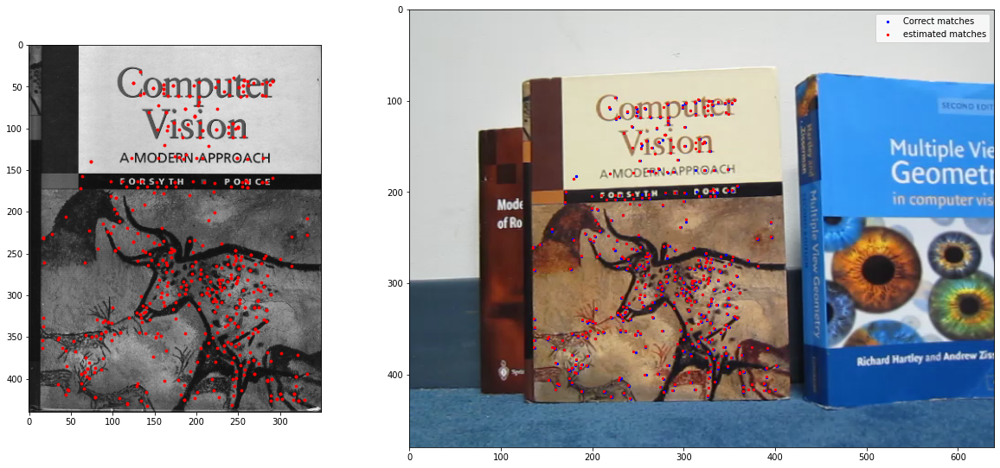

In [ ]:
verify(correspondances, h, img, first_frame)

## **1.3 Calculate Book Coordinates**

In [ ]:
def getCorners(img, h):
  img_shape = img.shape
  # the four corners of the book in the image
  p1_dash = compute_p_dash(h, (0, 0))
  p2_dash = compute_p_dash(h, (0, img_shape[0]))
  p3_dash = compute_p_dash(h, (img_shape[1], img_shape[0]))
  p4_dash = compute_p_dash(h, (img_shape[1], 0))

  return p1_dash, p2_dash, p3_dash, p4_dash

In [ ]:
def regionOfInterest(p1, p2, p3, p4, frame):
  # region of interest
  polygons = np.array([
      [p1 , p2, p3, p4,]
      ])
  mask = np.zeros_like(frame)
  cv2.fillPoly(mask, np.int32(polygons), (255, 255, 255))
  return mask

(118, 76)
(124, 434)
(418, 429)
(403, 61)


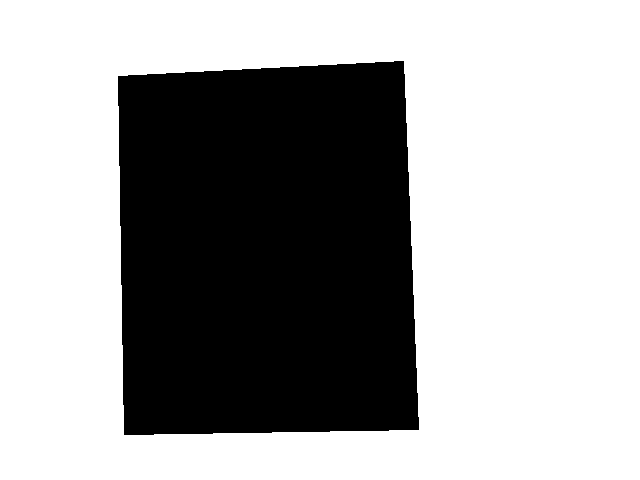

In [ ]:
p1_dash, p2_dash, p3_dash, p4_dash = getCorners(img, h)
print(p1_dash)
print(p2_dash)
print(p3_dash)
print(p4_dash)
mask = np.invert(regionOfInterest(p1_dash, p2_dash, p3_dash, p4_dash, first_frame))
cv2_imshow(mask)

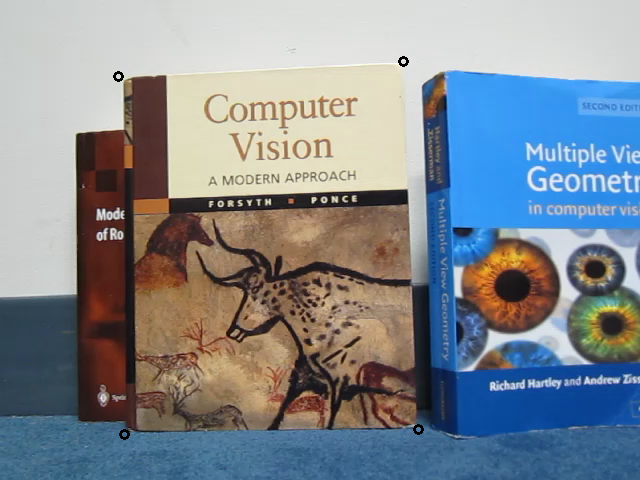

In [ ]:
# draw corners
copy = first_frame.copy()
cv2.circle(copy, (p1_dash[0], p1_dash[1]), radius=4, color= (0, 0, 0), thickness=2)
cv2.circle(copy, (p2_dash[0], p2_dash[1]), radius=4, color= (0, 0, 0), thickness=2)
cv2.circle(copy, (p3_dash[0], p3_dash[1]), radius=4, color= (0, 0, 0), thickness=2)
cv2_imshow(cv2.circle(copy, (p4_dash[0], p4_dash[1]), radius=4, color= (0, 0, 0), thickness=2))

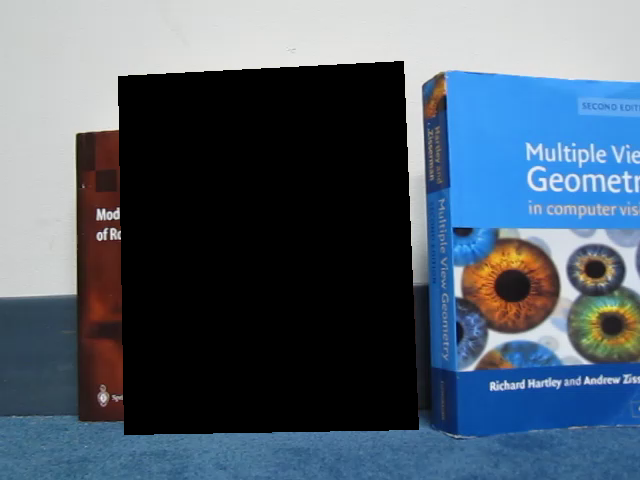

In [ ]:
final_img = cv2.bitwise_and(mask , first_frame)
cv2_imshow(final_img)

## **1.4 Crop AR Video Frames**

In [ ]:
panda_frames = loadVid(folder + '/ar_source.mov')

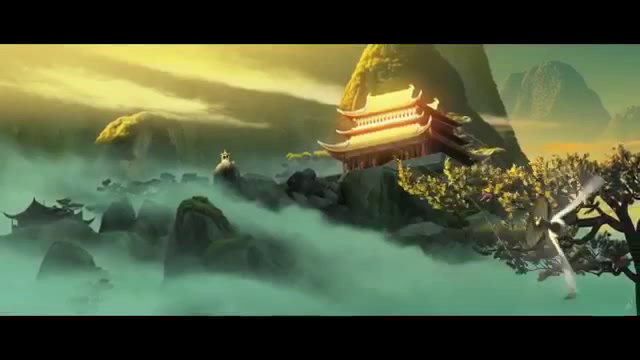

(360, 640, 3)


In [ ]:
cv2_imshow(panda_frames[0])
print(panda_frames[0].shape)

Removing black borders and resizing frame

In [ ]:
#  we got the borders indecies from above img
def remove_borders_and_resize(img, new_size):
  mask = img>15
  if img.ndim==3:
      mask = mask.all(2)
  m,n = mask.shape
  mask0,mask1 = mask.any(0),mask.any(1)
  row_start,row_end = mask1.argmax(),m-mask1[::-1].argmax()
  cropped_img = img[row_start:row_end,:].copy()
  return cv2.resize(cropped_img, new_size, interpolation = cv2.INTER_LINEAR)

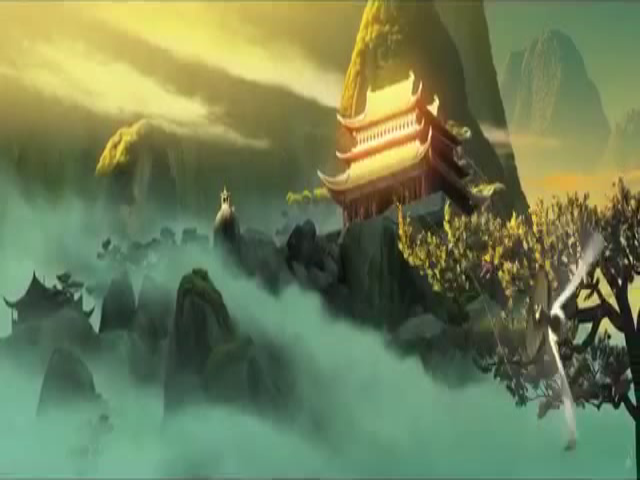

(480, 640, 3)


In [ ]:
resized = remove_borders_and_resize(panda_frames[0], (book_frames[0].shape[1] , book_frames[0].shape[0]))
cv2_imshow(resized)
print(resized.shape)

Making center of book same as center of video frame to crop only center of frame

In [ ]:
def get_cropped_frame_center(bk_corner1, bk_corner2, bk_corner3, bk_corner4, frame):
  # calculate frame center
  frame_center = (int(frame.shape[1]/2), int(frame.shape[0]/2))
  
  # calculate book frame
  book_center = (int((bk_corner1[0] + bk_corner2[0] + bk_corner3[0] + bk_corner4[0]) / 4),
                 int((bk_corner1[1] + bk_corner2[1] + bk_corner3[1] + bk_corner4[1]) / 4))
  
  offset_x = frame_center[0] - book_center[0]
  offset_y = frame_center[1] - book_center[1]
 
  # add offset to book corners and create new mask
  p1 = tuple(map(operator.add, bk_corner1, (offset_x, offset_y)))
  p2 = tuple(map(operator.add, bk_corner2, (offset_x, offset_y)))
  p3 = tuple(map(operator.add, bk_corner3, (offset_x, offset_y)))
  p4 = tuple(map(operator.add, bk_corner4, (offset_x, offset_y)))
  mask = regionOfInterest(p1, p2, p3, p4, frame)
  cropped_frame = cv2.bitwise_and(mask , frame)

  # translation matrix to move cropped frame back to image center
  translation_matrix = np.float32([[1, 0, -offset_x],
                                 [0, 1, -offset_y]])
    
  img_translation = cv2.warpAffine(cropped_frame, translation_matrix, dsize=(cropped_frame.shape[1], cropped_frame.shape[0]))

  return img_translation

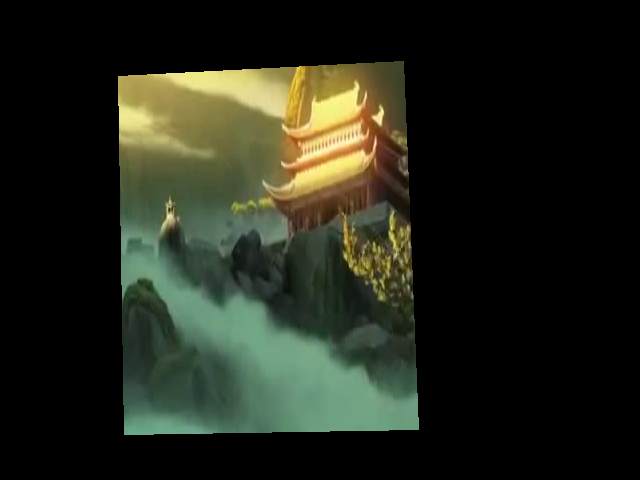

In [ ]:
img_translation = get_cropped_frame_center(p1_dash, p2_dash, p3_dash, p4_dash, resized)
cv2_imshow(img_translation)





## **1.5 Overlay the First Frame of the Two Videos**

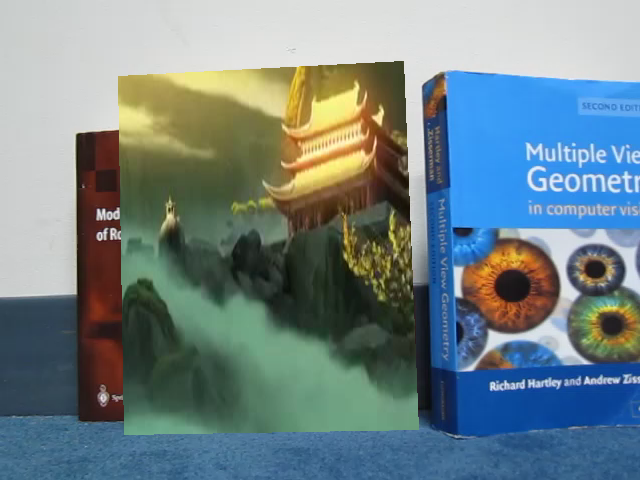

In [ ]:
cv2_imshow(cv2.bitwise_or(final_img , img_translation))

In [ ]:
def over_frames(img, book_frame, panda_frame):
  # compute correspondance for the book in this frame
  correspondances, _ = getMatches(img, book_frame)

  # apply RANSAC and get max inliers
  max_inliers = RANSAC(correspondances)
  h = computeHomography(max_inliers)

  # get mapped corners in frame
  p1_dash, p2_dash, p3_dash, p4_dash = getCorners(img, h)
  mask = regionOfInterest(p1_dash, p2_dash, p3_dash, p4_dash, book_frame)

  #  masking the book in the frame
  final_book_frame = cv2.bitwise_and(np.invert(mask) , book_frame)

  # resizing the panda frame to be the same size as the book frame
  resized_panda_frame = remove_borders_and_resize(panda_frame, (book_frame.shape[1] , book_frame.shape[0]))

  # get cropped panda frame after masking 
  cropped_panda_frame = get_cropped_frame_center(p1_dash, p2_dash, p3_dash, p4_dash, resized_panda_frame)

  final_over_layed_frame = cv2.bitwise_or(final_book_frame , cropped_panda_frame)
  return final_over_layed_frame

## **1.6 Creating AR Application**

In [ ]:
def create_AR_application(book_img, book_frames, panda_frames):
  height, width, _ = book_frames[0].shape
  fourcc = cv2.VideoWriter_fourcc(*'XVID')
  video = cv2.VideoWriter(folder + '/kung-fu-panda-on-book.mov', fourcc, 20.0, (width,height))

  for i in range(min(book_frames.shape[0], panda_frames.shape[0])):
    over_layed_frame = over_frames(book_img, book_frames[i], panda_frames[i])
    # add frame to video
    # print('Adding frame ', i)
    video.write(over_layed_frame)

  video.release()

In [ ]:
create_AR_application(img, book_frames, panda_frames)

# **Part 2**

### **Load Images**

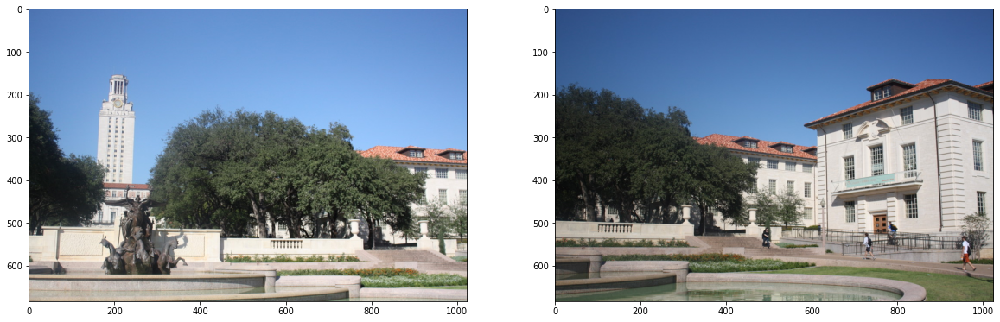

In [ ]:
img1 = cv2.imread(folder + '/pano_image1.jpg')
img2 = cv2.imread(folder + '/pano_image2.jpg')
figure, axis = plt.subplots(1, 2, figsize=(20, 20), gridspec_kw={'width_ratios': [2, 2]})
axis[0].imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
axis[1].imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
plt.show()

## **2.1 Getting Correspondences and Compute the Homography Parameters**

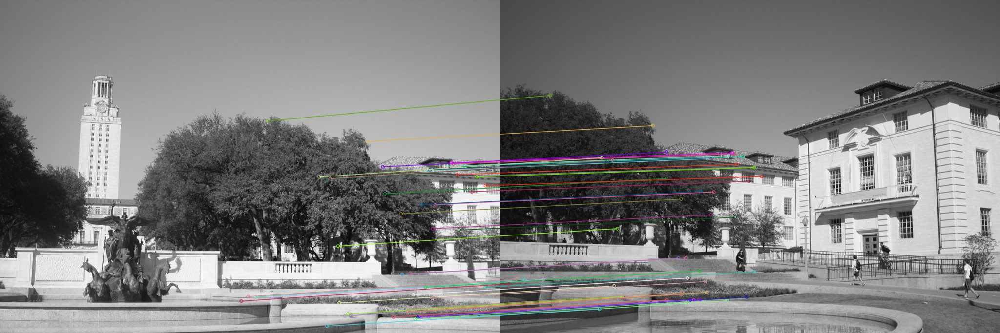

In [ ]:
stitch_correspondances, matched_img = getMatches(img1, img2)
cv2_imshow(matched_img)

# apply RANSAC and get max inliers
stitch_max_inliers = RANSAC(stitch_correspondances)
h = computeHomography(stitch_max_inliers)

In [ ]:
print("computed h\n", h)
# built in comparison 
src_points_stitch = [[src[0], src[1]] for src, dest in stitch_max_inliers]
dest_points_stitch = [[dest[0], dest[1]] for src, dest in stitch_max_inliers]
built_in_h_stitch, _ = cv2.findHomography(np.array(src_points_stitch), np.array(dest_points_stitch))
print("Built in h\n", built_in_h_stitch)

computed h
 [[ 1.30045647e+00 -7.40146840e-02 -5.75062300e+02]
 [ 1.70107437e-01  1.22206133e+00 -1.68874863e+02]
 [ 2.80719191e-04  2.24298770e-05  1.00000000e+00]]
Built in h
 [[ 1.29746113e+00 -7.46615339e-02 -5.73198645e+02]
 [ 1.69265751e-01  1.21897052e+00 -1.67801712e+02]
 [ 2.79058598e-04  2.02524222e-05  1.00000000e+00]]


## **2.2 Warping Between Image Planes**

In [ ]:
def get_borders(corner1, corner2, corner3, corner4):
  min_x = min(corner1[0], corner2[0], corner3[0], corner4[0])
  min_y = min(corner1[1], corner2[1], corner3[1], corner4[1])

  max_x = max(corner1[0], corner2[0], corner3[0], corner4[0])
  max_y = max(corner1[1], corner2[1], corner3[1], corner4[1])

  return (min_x, min_y), (max_x, max_y)

In [ ]:
def warp_image(img1, img2, h, corners=False):
  # forward warp to get img corners
  corner1_estimate, corner2_estimate, corner3_estimate, corner4_estimate = getCorners(img1, h)

  # drow corners 
  if corners :
    figure, axis = plt.subplots(1, 2, figsize=(20, 20), gridspec_kw={'width_ratios': [2, 2]})
    axis[0].imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))

    axis[1].imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    axis[1].scatter(x=np.asarray([corner1_estimate[0], corner2_estimate[0], corner3_estimate[0], corner4_estimate[0]]), y=np.asarray([corner1_estimate[1], corner2_estimate[1], corner3_estimate[1], corner4_estimate[1]]), c='b', s=5)

    plt.show()

  # get border of new big image
  border_min_point, _ = get_borders(corner1_estimate, corner2_estimate, (0, 0), (0, img2.shape[0]))
  _, border_max_point = get_borders(corner3_estimate, corner4_estimate, (img2.shape[1], 0), (img2.shape[1], img2.shape[0]))

  # create new image for the stitch
  height = border_max_point[1] - border_min_point[1]
  width = border_max_point[0] - border_min_point[0]

  final_img = np.zeros(( height, width, 3))

  # get border of image to be warpped to loop over
  warped_min_border, warped_max_border = get_borders(corner1_estimate, corner2_estimate, corner3_estimate, corner4_estimate)

  # add img2 to the warped_img to output the final image
  # border of image 2
  corners = [(0,0), (0, img2.shape[0]), (img2.shape[1], img2.shape[0], (img2.shape[1], 0))]
  shifted_corners = [(point[0] - warped_min_border[0], point[1] - warped_min_border[1]) for point in corners]
  final_img[shifted_corners[0][1]:shifted_corners[2][1],shifted_corners[0][0]:shifted_corners[2][0]] = img2


  # backward warp
  # inverse homography
  h_inverse = np.linalg.inv(h)
  for i in range(warped_min_border[0], warped_max_border[0]):
    for j in range(warped_min_border[1], warped_max_border[1]):
      p_dash = compute_p_dash(h_inverse, (i, j),True)
      # if p_dash is out of image border skip this point
      if p_dash[0] < 0 or p_dash[0] > img1.shape[1]-1 or p_dash[1] < 0 or p_dash[1] > img1.shape[0]-1:
        continue
      new_x = abs(border_min_point[0] - i)
      new_y = abs(border_min_point[1] - j)
      #final_img[new_y][new_x] = img1[p_dash[1]][p_dash[0]] 
      
      final_img[new_y][new_x]=interpolation(p_dash[0],p_dash[1],img1)

  return final_img, warped_min_border



In [ ]:
def interpolation(x,y,image) : 
    x1 = math.floor(x)
    x2 = math.ceil(x)
    y1 = math.floor(y)
    y2 = math.ceil(y)
    w1 = (abs(y-y2))*(abs(x-x2))*image[y1][x1]
    w2 = (abs(y-y1))*(abs(x-x1))*image[y2][x2]
    w3 = (abs(y-y1))*(abs(x-x2))*image[y1][x2]
    w4 = (abs(y-y2))*(abs(x-x1))*image[y2][x1]

    return w1+w2+w3+w4


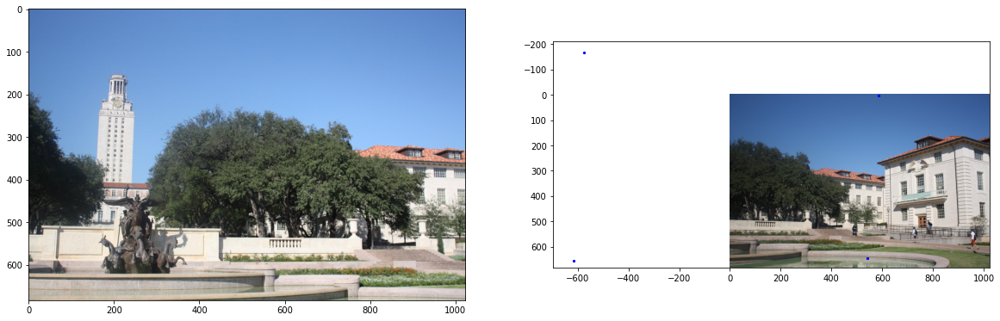

In [ ]:
warped_img, _ = warp_image(img1, img2, h, True)

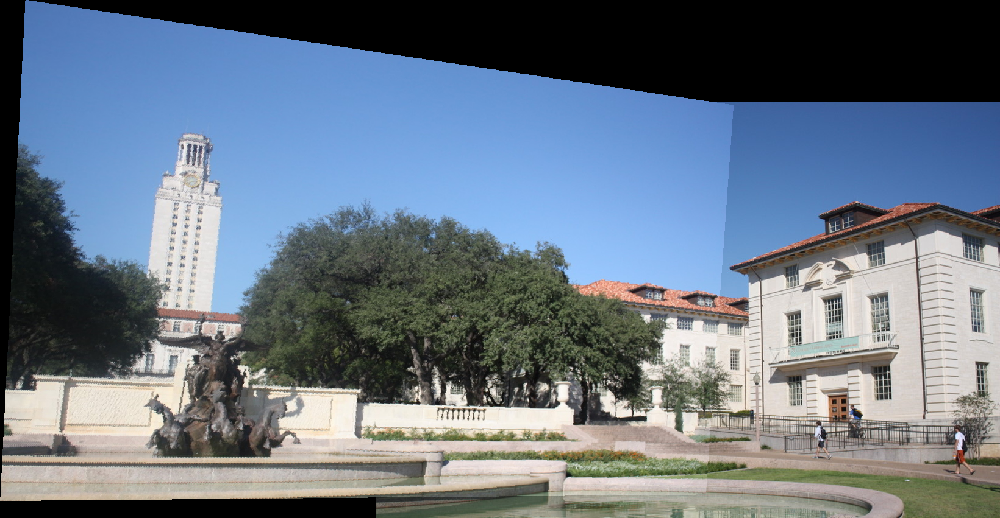

In [ ]:
cv2_imshow(warped_img)

## **2.3 Create the output mosaic**

In [ ]:
def stitch_imges(img1, img2):
  stitch_correspondances, _ = getMatches(img1, img2)

  # apply RANSAC and get max inliers
  stitch_max_inliers = RANSAC(stitch_correspondances)
  h = computeHomography(stitch_max_inliers)

  warped_img, warped_img_min_border = warp_image(img1, img2, h)

  cv2_imshow(warped_img)
  return warped_img.astype(np.uint8)

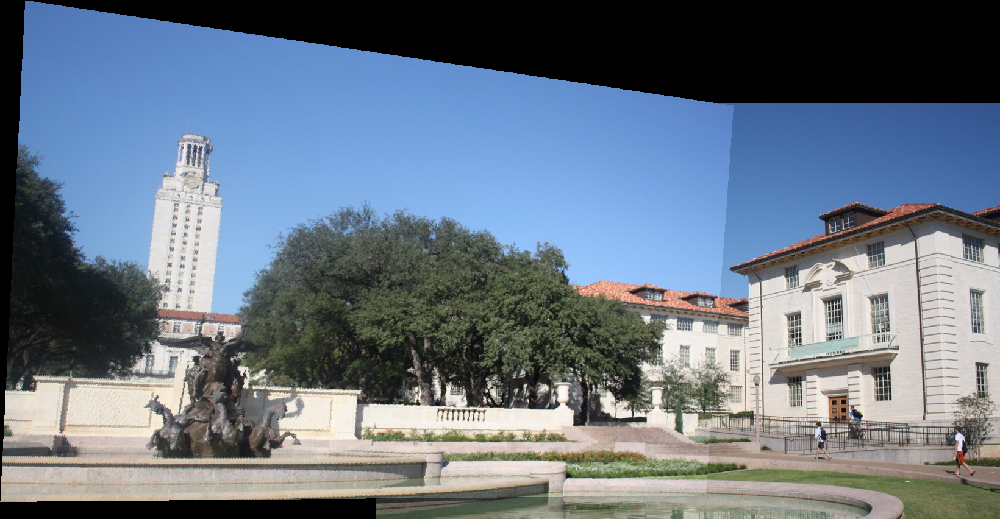

array([[[ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        ...,
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.]],

       [[ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        ...,
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.]],

       [[ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        ...,
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.]],

       ...,

       [[ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        ...,
        [51., 85., 79.],
        [54., 88., 82.],
        [55., 89., 83.]],

       [[ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        ...,
        [51., 87., 81.],
        [53., 89., 83.],
        [55., 91., 85.]],

       [[ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        ...,
        [52., 88., 82.],
        [53., 91., 85.],
        [55., 93., 87.]]

In [ ]:
stitch_imges(img1, img2)

# **BONUS**

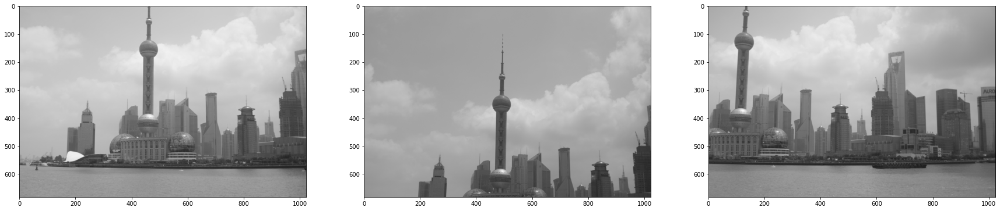

In [ ]:
shanghgai1 = cv2.imread(folder + '/shanghai-21.png')
shanghgai2 = cv2.imread(folder + '/shanghai-22.png')
shanghgai3 = cv2.imread(folder + '/shanghai-23.png')

figure, axis = plt.subplots(1, 3, figsize=(30, 30), gridspec_kw={'width_ratios': [2, 2, 2]})
axis[0].imshow(cv2.cvtColor(shanghgai1, cv2.COLOR_BGR2RGB))
axis[1].imshow(cv2.cvtColor(shanghgai2, cv2.COLOR_BGR2RGB))
axis[2].imshow(cv2.cvtColor(shanghgai3, cv2.COLOR_BGR2RGB))
plt.show()

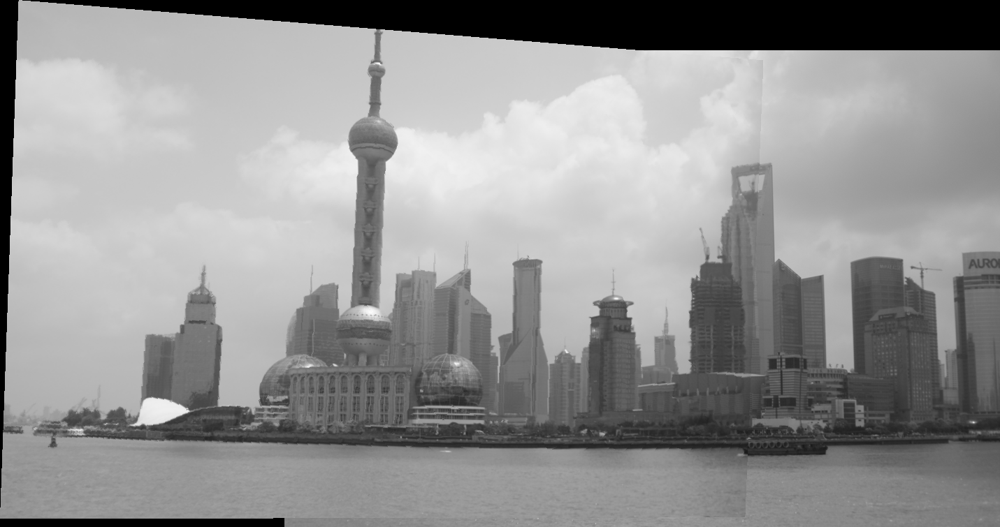

In [ ]:
first_img = stitch_imges(shanghgai1, shanghgai3)

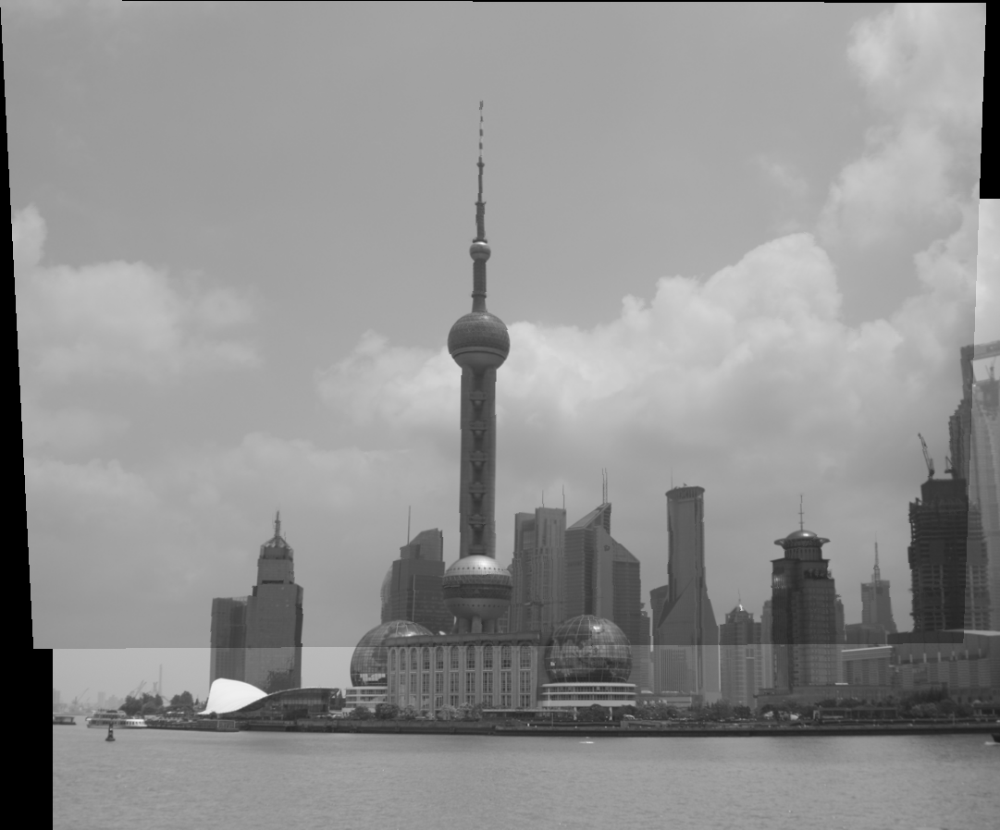

In [ ]:
second_img = stitch_imges(shanghgai2, shanghgai1)

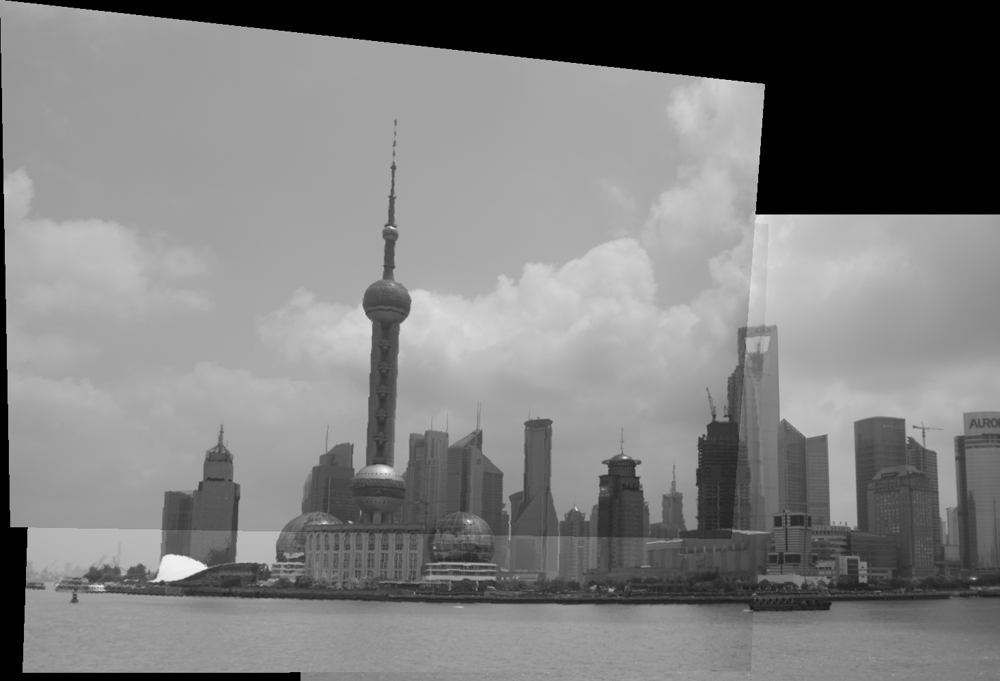

In [ ]:
final_img = stitch_imges(shanghgai2, first_img)